In [1]:
import xarray as xr
import pandas as pd
import numpy as np
import calendar as cld
import matplotlib.pyplot as plt
import matplotlib.colors
colors_land = plt.cm.terrain(np.linspace(0.25, 1, 256))
import proplot as pplt # New plot library (https://proplot.readthedocs.io/en/latest/)
pplt.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy.stats import chi2
from numba import njit,prange
import matplotlib as mpl
mpl.rcParams['hatch.linewidth'] = 0.05  # previous pdf hatch linewidth
from matplotlib.dates import DateFormatter

from scipy.stats import linregress

In [27]:
normal_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':True,
                 'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[43.,48.5],'lonlim':[4.,16.]}
multiplot_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':False,
                    'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[43.,48.5],'lonlim':[4.,16.]}

imin = 32 ; imax = -30
jmin = 20 ; jmax = -15
ds = xr.open_dataset('/bettik/beaumetj/MARout/MAR-ERA-20C/MARgrid_EUf.nc')
lon = ds.LON[jmin:jmax,imin:imax]
lat = ds.LAT[jmin:jmax,imin:imax]
H = np.array(ds.SH[jmin:jmax,imin:imax])

seasons = ['DJF','MAM','JJA', 'SON']

In [3]:
wp_meanseason_meanT = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanT.npy')[:,:,jmin:jmax,imin:imax]
origin_T=np.full(wp_meanseason_meanT.shape[1:4],np.nan)
slope_T=np.full(wp_meanseason_meanT.shape[1:4],np.nan)
pvalue_T=np.full(wp_meanseason_meanT.shape[1:4],np.nan)
for i in range(wp_meanseason_meanT.shape[3]):
    # print(str(lon)+'/'+str(les_season_maxT.shape[3]),end=' ')
    for j in range(wp_meanseason_meanT.shape[2]):
        for season in range(4):
            linregress_T = linregress(np.arange(wp_meanseason_meanT.shape[0]), wp_meanseason_meanT[:,season,j,i])
            origin_T[season][j][i] = linregress_T.intercept
            slope_T[season][j][i] = linregress_T.slope
            pvalue_T[season][j][i] = linregress_T.pvalue

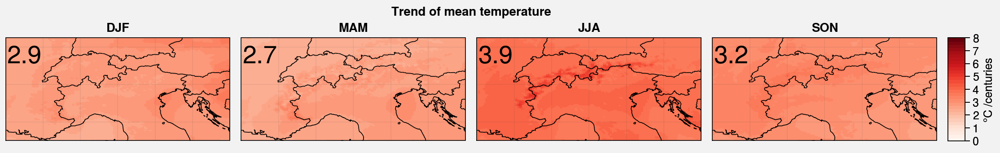

In [4]:
f, axs = pplt.subplots(proj='cyl',ncols=4)

for i in range(4):
    ax = axs[i]
    cb = ax.pcolormesh(lon,lat,100*slope_T[i],levels=np.linspace(0,8,33),cmap='Reds')#'seismic')

    ax.text(5,47.5,"{:.1f}".format(np.mean(100*slope_T[i])),ha='center',va='center',fontsize=20)

f.colorbar(cb, label= '°C /centuries',ticks=np.linspace(0,8,9))

axs.format(**multiplot_format,suptitle='Trend of mean temperature',collabels=['DJF','MAM','JJA', 'SON'])


#### Scatter plots for temperature trends as a function of altitude

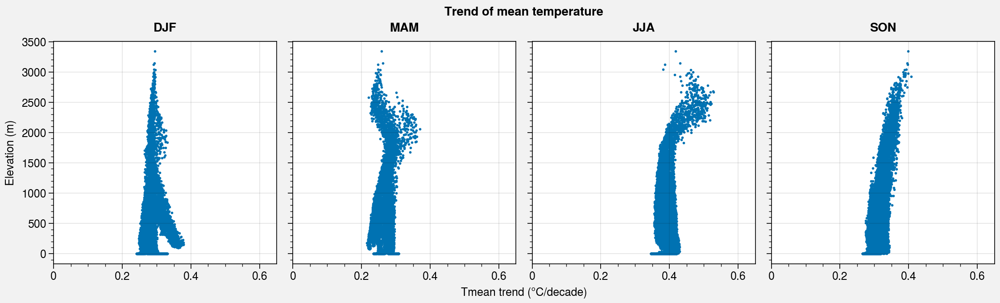

In [4]:
f, axs = pplt.subplots(ncols=4)

for i in range(4):
    ax = axs[i]
    ax.scatter(10*slope_T[i],ds.SH[jmin:jmax,imin:imax],s=2)
    ax.set_xlim((0.,0.65))
    

axs.format(suptitle='Trend of mean temperature',collabels=['DJF','MAM','JJA', 'SON'],xlabel='Tmean trend (°C/decade)',ylabel='Elevation (m)')

In [4]:
wp_meanseason_meanT_hist = wp_meanseason_meanT[:54,:,:,:]
wp_meanseason_meanT_fut = wp_meanseason_meanT[55:,:,:,:]

origin_T_hist=np.full(wp_meanseason_meanT_hist.shape[1:4],np.nan)
slope_T_hist=np.full(wp_meanseason_meanT_hist.shape[1:4],np.nan)
pvalue_T_hist=np.full(wp_meanseason_meanT_hist.shape[1:4],np.nan)

origin_T_fut=np.full(wp_meanseason_meanT_fut.shape[1:4],np.nan)
slope_T_fut=np.full(wp_meanseason_meanT_fut.shape[1:4],np.nan)
pvalue_T_fut=np.full(wp_meanseason_meanT_fut.shape[1:4],np.nan)

for i in range(wp_meanseason_meanT.shape[3]):
    # print(str(lon)+'/'+str(les_season_maxT.shape[3]),end=' ')
    for j in range(wp_meanseason_meanT.shape[2]):
        for season in range(4):
            linregress_T_hist = linregress(np.arange(wp_meanseason_meanT_hist.shape[0]), wp_meanseason_meanT_hist[:,season,j,i])
            origin_T_hist[season][j][i] = linregress_T_hist.intercept
            slope_T_hist[season][j][i] = linregress_T_hist.slope
            pvalue_T_hist[season][j][i] = linregress_T_hist.pvalue
            
            linregress_T_fut = linregress(np.arange(wp_meanseason_meanT_fut.shape[0]), wp_meanseason_meanT_fut[:,season,j,i])
            origin_T_fut[season][j][i] = linregress_T_fut.intercept
            slope_T_fut[season][j][i] = linregress_T_fut.slope
            pvalue_T_fut[season][j][i] = linregress_T_fut.pvalue

In [5]:
wp_meanseason_meanT.shape[3]

139

(<matplotlib.legend.Legend at 0x7fb50d9faf70>,
 <matplotlib.legend.Legend at 0x7fb50dae64c0>)

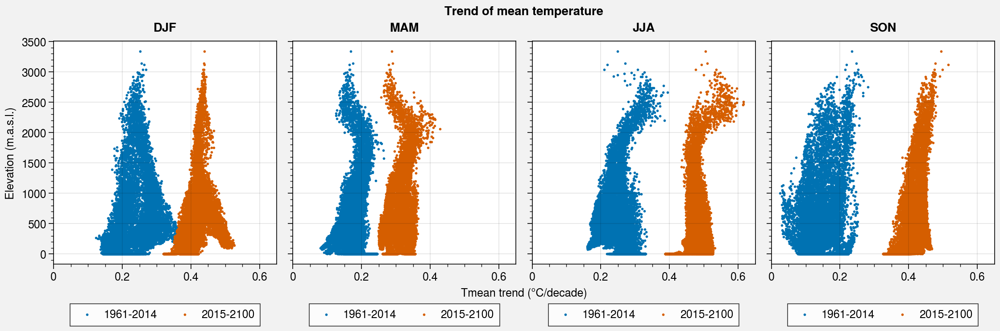

In [7]:
f, axs = pplt.subplots(ncols=4)
leg = ['1961-2014','2015-2100']
#blue_dot = 

for i in range(4):
    ax = axs[i]
    blue_dot = ax.scatter(10*slope_T_hist[i],ds.SH[jmin:jmax,imin:imax],s=2)
    ax.set_xlim((0.,0.65))
    #ax.legend(blue_dot,"Historic")
    
for i in range(4):
    ax = axs[i]
    orange_dot = ax.scatter(10*slope_T_fut[i],ds.SH[jmin:jmax,imin:imax],s=2)
    ax.set_xlim((0.,0.65))
#    ax.legend()

axs.format(suptitle='Trend of mean temperature',collabels=['DJF','MAM','JJA', 'SON'],xlabel='Tmean trend (°C/decade)',ylabel='Elevation (m.a.s.l.)')
axs.legend([blue_dot,orange_dot],leg,loc='bottom')

In [6]:
def detect_alps(H):
    nlat,nlon = np.shape(H)
    mask = np.bool8(np.zeros((nlat,nlon)))
    r = 4
    for j in range(r,nlat-r):
        for i in range(r,nlon-r):
            mask[j,i] = np.logical_and(H[j,i]>360 ,np.any(H[j-r:j+r,i-r:i+r]>1300))
            # mask[j,i] = np.std(H[j-r:j+r,i-r:i+r])>200
    return mask
alps = detect_alps(H)
alps[lon<4.8] = False
alps[np.logical_and(lon>10,lat<45.2)] = False

north_alps = np.copy(alps)
north_alps[lon>8.6] = False
north_alps[lat<45] = False
#north_alps[lat>46.5] = False

south_alps = np.copy(alps)
south_alps[lat>45] = False

east_alps = np.copy(alps)
east_alps[lon<8.6] = False

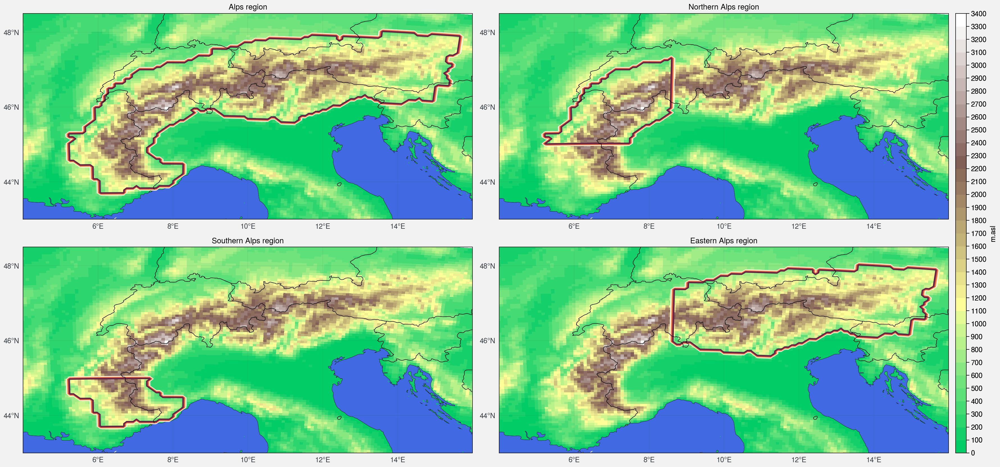

In [9]:
f, axs = pplt.subplots(proj='cyl', ncols=2, nrows=2, axwidth=8)

m=axs[0].pcolormesh(lon, lat, H, levels=34,cmap=colors_land)
f.colorbar(m,label= 'm.asl')
axs[0].contour(lon, lat,alps)
axs[0].format(**normal_format,title='Alps region')
axs[0].format(ocean=True,oceancolor='royalblue',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])


m=axs[1].pcolormesh(lon, lat, H, levels=34,cmap=colors_land)
axs[1].contour(lon, lat,north_alps)
axs[1].format(**normal_format,title='Northern Alps region')
axs[1].format(ocean=True,oceancolor='royalblue',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])


m=axs[2].pcolormesh(lon, lat, H, levels=34,cmap=colors_land)
axs[2].contour(lon, lat,south_alps)
axs[2].format(**normal_format,title='Southern Alps region')
axs[2].format(ocean=True,oceancolor='royalblue',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])


m=axs[3].pcolormesh(lon, lat, H, levels=34,cmap=colors_land)
axs[3].contour(lon, lat,east_alps)
axs[3].format(**normal_format,title='Eastern Alps region')
axs[3].format(ocean=True,oceancolor='royalblue',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])

#### Alps masks

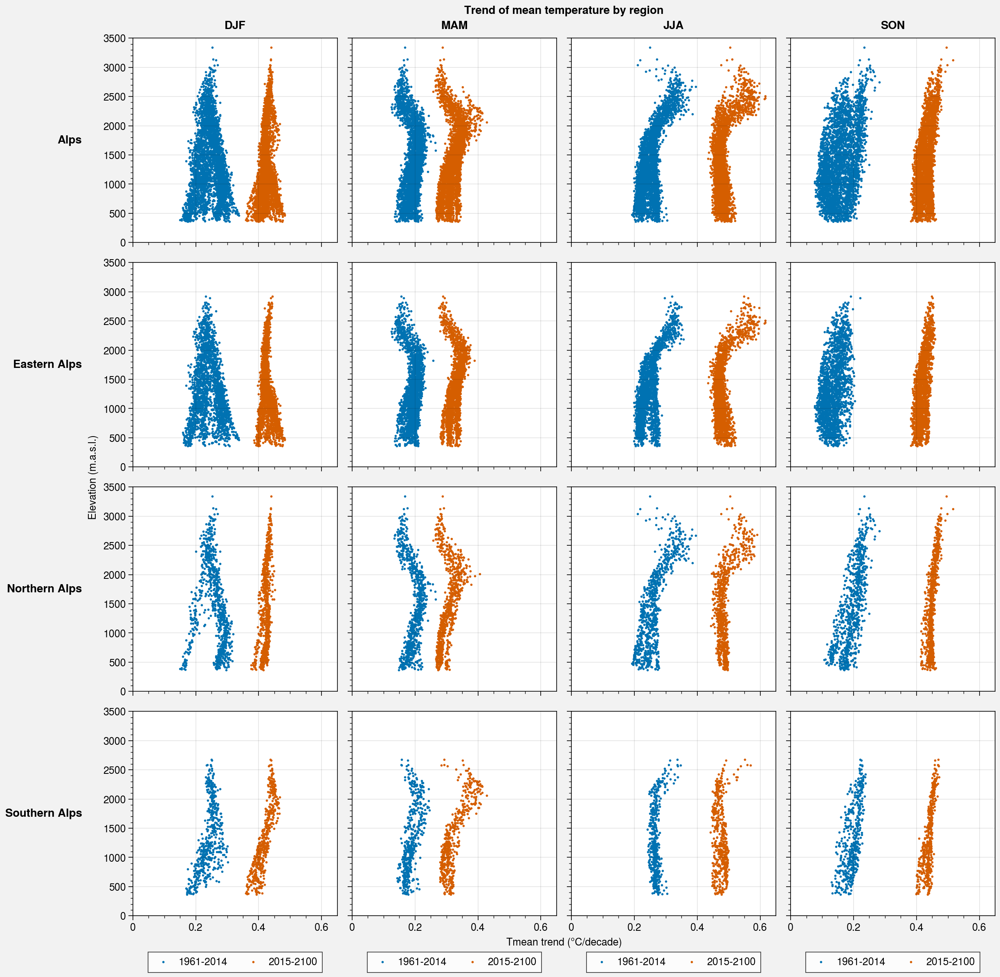

In [7]:
f, axs = pplt.subplots(ncols=4, nrows=4)
leg = ['1961-2014','2015-2100']

for i in range(4):
    slope_T_hist_alps = np.ma.masked_array(slope_T_hist[i], mask=np.invert(alps))
    slope_T_hist_east_alps = np.ma.masked_array(slope_T_hist[i], mask=np.invert(east_alps))
    slope_T_hist_north_alps = np.ma.masked_array(slope_T_hist[i], mask=np.invert(north_alps))
    slope_T_hist_south_alps = np.ma.masked_array(slope_T_hist[i], mask=np.invert(south_alps))
    slopes=[slope_T_hist_alps,slope_T_hist_east_alps,slope_T_hist_north_alps,slope_T_hist_south_alps]
    
    for j,slope in enumerate(slopes):
        ax = axs[i+4*j]
        blue_dot = ax.scatter(10*slope,ds.SH[jmin:jmax,imin:imax],s=2)
        
    
for i in range(4):
    slope_T_fut_alps = np.ma.masked_array(slope_T_fut[i], mask=np.invert(alps))
    slope_T_fut_east_alps = np.ma.masked_array(slope_T_fut[i], mask=np.invert(east_alps))
    slope_T_fut_north_alps = np.ma.masked_array(slope_T_fut[i], mask=np.invert(north_alps))
    slope_T_fut_south_alps = np.ma.masked_array(slope_T_fut[i], mask=np.invert(south_alps))
    slopes=[slope_T_fut_alps,slope_T_fut_east_alps,slope_T_fut_north_alps,slope_T_fut_south_alps]
    
    for j,slope in enumerate(slopes):
        ax = axs[i+4*j]
        orange_dot = ax.scatter(10*slope,ds.SH[jmin:jmax,imin:imax],s=2)
        ax.set_xlim((0.,0.65))
        ax.set_ylim((0.,3500))
        if(j==3):
            ax.legend([blue_dot,orange_dot],leg,loc='bottom')

axs.format(suptitle='Trend of mean temperature by region',collabels=['DJF','MAM','JJA', 'SON'],
           rowlabels=['Alps','Eastern Alps','Northern Alps','Southern Alps'],xlabel='Tmean trend (°C/decade)',ylabel='Elevation (m.a.s.l.)')
#axs.legend([blue_dot,orange_dot],leg,loc='bottom')
#import matplotlib.patches as mpatches
#axs.legend(handles=[ mpatches.Patch(color=[(1,0.5,0,1),(0,0,1,1)],label=leg) for i in range(2)],
#          fontsize=15, ncols=2, center=True, frame=False, loc='t')

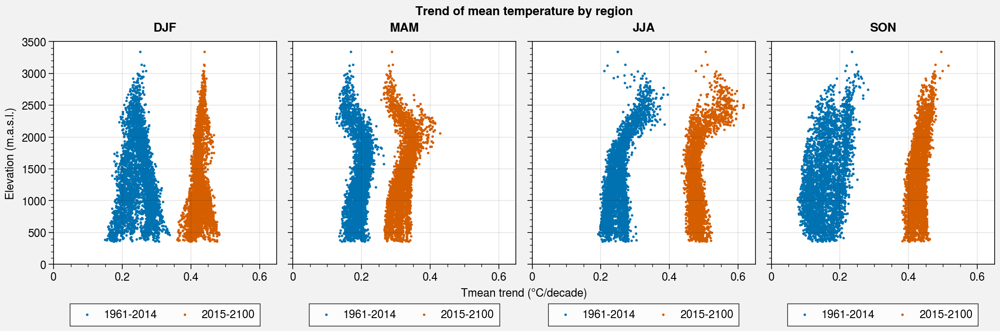

In [8]:
f, axs = pplt.subplots(ncols=4)
leg = ['1961-2014','2015-2100']

for i in range(4):
    slope_T_hist_alps = np.ma.masked_array(slope_T_hist[i], mask=np.invert(alps))

    ax = axs[i]
    blue_dot = ax.scatter(10*slope_T_hist_alps,ds.SH[jmin:jmax,imin:imax],s=2)
        
    
for i in range(4):
    slope_T_fut_alps = np.ma.masked_array(slope_T_fut[i], mask=np.invert(alps))

    ax = axs[i]
    orange_dot = ax.scatter(10*slope_T_fut_alps,ds.SH[jmin:jmax,imin:imax],s=2)
    ax.set_xlim((0.,0.65))
    ax.set_ylim((0.,3500))
    ax.legend([blue_dot,orange_dot],leg,loc='bottom')

axs.format(suptitle='Trend of mean temperature by region',collabels=['DJF','MAM','JJA', 'SON'],
           xlabel='Tmean trend (°C/decade)',ylabel='Elevation (m.a.s.l.)')

(0.0, 3500.0)

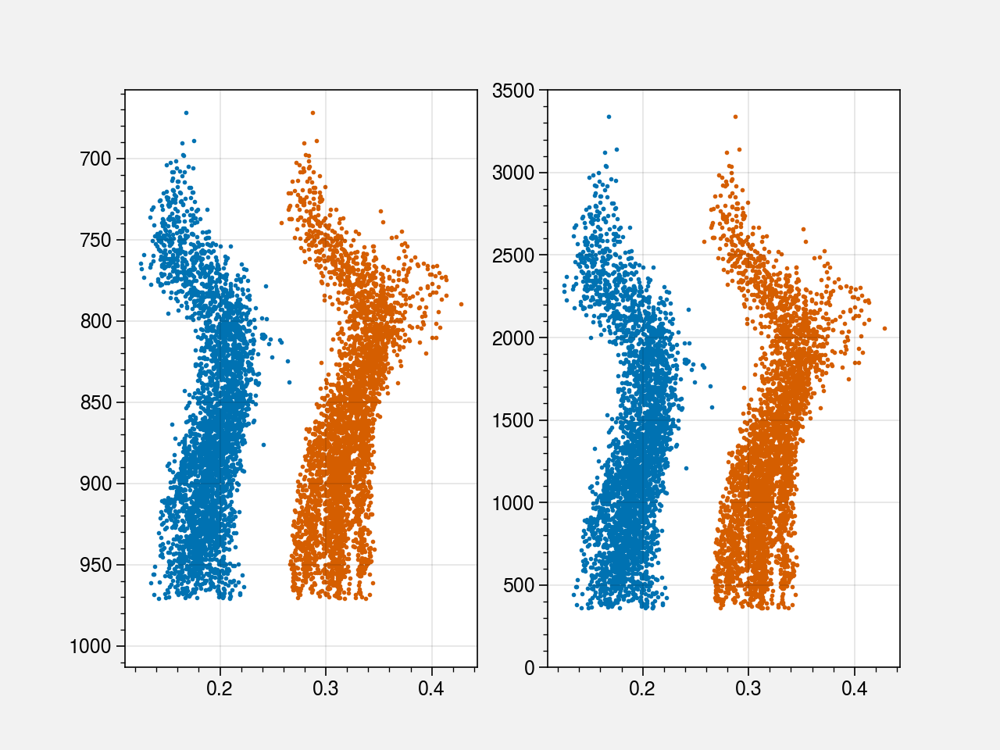

In [9]:
# Ajout de coordonnée verticale pression dans le cas de l'atmosphère standard OACI
def z_to_p(H):
    p0 = 1013.25 # hPa
    gamma = 6.5*10**(-3) # K/m
    T0 = 288.5 # K
    g = 9.81 # m.s^-2
    R = 287 # J/kg/K
    pressure = p0*(1-gamma/T0*H)**(g/gamma/R)
    return pressure

# compare with pressure coordinate

f, axs = plt.subplots(ncols=2)
leg = ['1961-2014','2015-2100']

ax = axs[0]
blue_dot = ax.scatter(10*np.ma.masked_array(slope_T_hist[1], mask=np.invert(alps)),z_to_p(ds.SH[jmin:jmax,imin:imax]),s=2)
orange_dot = ax.scatter(10*np.ma.masked_array(slope_T_fut[1], mask=np.invert(alps)),z_to_p(ds.SH[jmin:jmax,imin:imax]),s=2)
ax.set_ylim((1013.25,657.85))

ax = axs[1]
blue_dot = ax.scatter(10*np.ma.masked_array(slope_T_hist[1], mask=np.invert(alps)),ds.SH[jmin:jmax,imin:imax],s=2)
orange_dot = ax.scatter(10*np.ma.masked_array(slope_T_fut[1], mask=np.invert(alps)),ds.SH[jmin:jmax,imin:imax],s=2)
ax.set_ylim((0,3500))

(<matplotlib.legend.Legend at 0x7f843113e730>,
 <matplotlib.legend.Legend at 0x7f843112eee0>)

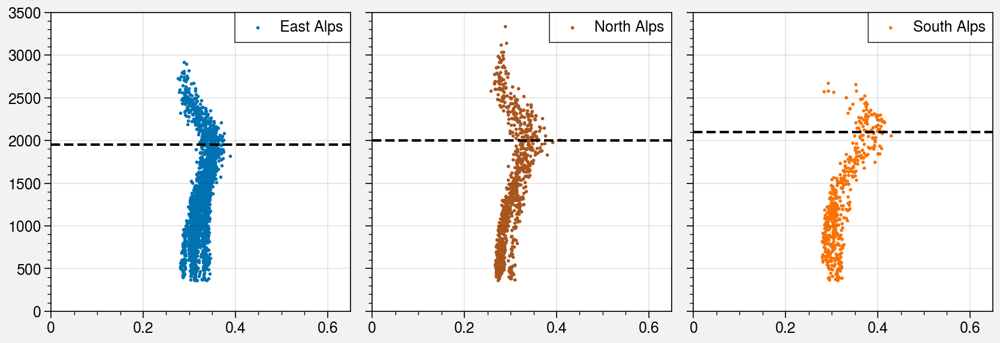

In [10]:
f,axs = pplt.subplots(ncols=3)
i=1

slope_T_fut_east_alps = np.ma.masked_array(slope_T_fut[i], mask=np.invert(east_alps))
slope_T_fut_north_alps = np.ma.masked_array(slope_T_fut[i], mask=np.invert(north_alps))
slope_T_fut_south_alps = np.ma.masked_array(slope_T_fut[i], mask=np.invert(south_alps))

axs[0].scatter(10*slope_T_fut_east_alps,ds.SH[jmin:jmax,imin:imax],s=2,label='East Alps')
axs[0].plot([0,0.7],[1950,1950],color='k',linestyle='--')
axs[1].scatter(10*slope_T_fut_north_alps,ds.SH[jmin:jmax,imin:imax],s=2,label='North Alps',color='sienna')
axs[1].plot([0,0.7],[2000,2000],color='k',linestyle='--')
axs[2].scatter(10*slope_T_fut_south_alps,ds.SH[jmin:jmax,imin:imax],s=2,label='South Alps',color='orange')
axs[2].plot([0,0.7],[2100,2100],color='k',linestyle='--')
axs.set_xlim((0.,0.65))
axs.set_ylim((0.,3500))
axs.legend()

Text(0.5, 1.0, 'Warming in Spring in the Alps')

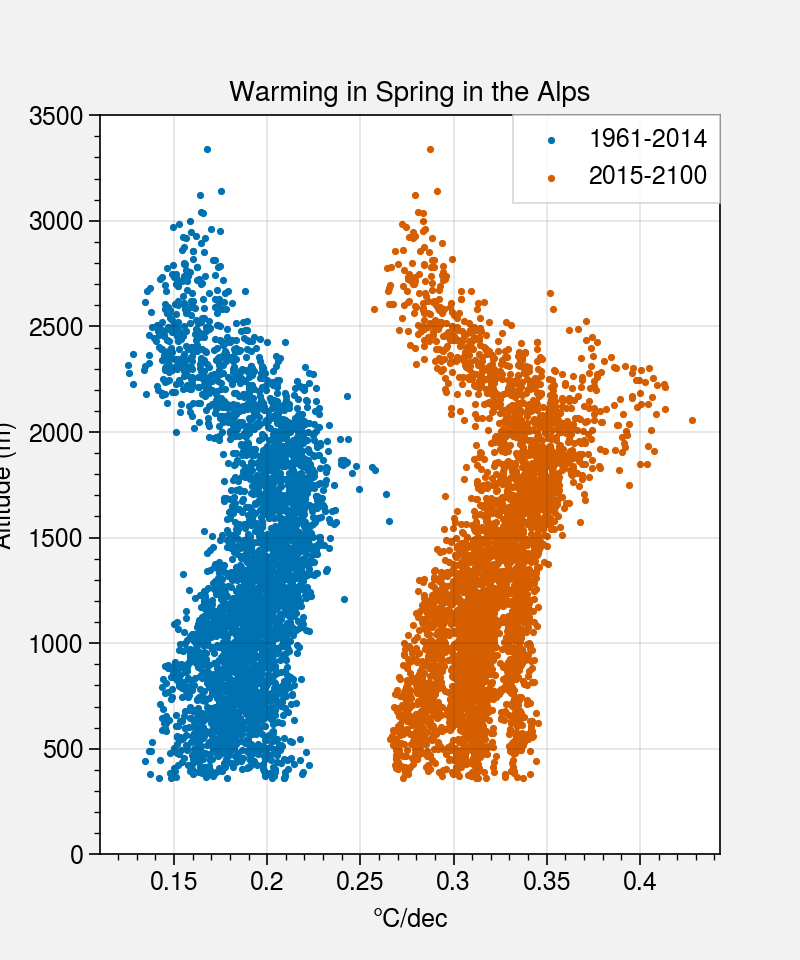

In [11]:
leg = ['1961-2014','2015-2100']

plt.figure().set_figwidth(4)
plt.scatter(10*np.ma.masked_array(slope_T_hist[1], mask=np.invert(alps)),ds.SH[jmin:jmax,imin:imax],s=4,label=leg[0])
plt.scatter(10*np.ma.masked_array(slope_T_fut[1], mask=np.invert(alps)),ds.SH[jmin:jmax,imin:imax],s=4,label=leg[1])
plt.ylim((0,3500))
plt.legend()
plt.xlabel('°C/dec')
plt.ylabel('Altitude (m)')
plt.title('Warming in Spring in the Alps')


In [12]:
wp_meanseason_meanSP = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanSP.npy')[:,:,jmin:jmax,imin:imax]

wp_meanseason_meanSP.shape

(140, 4, 91, 139)

In [13]:
wp_meanseason_meanSP_hist = wp_meanseason_meanSP[:54,:,:,:]
wp_meanseason_meanSP_fut = wp_meanseason_meanSP[55:,:,:,:]

wp_meanseason_meanSP_meanhist = wp_meanseason_meanSP_hist.mean(axis=0)
wp_meanseason_meanSP_meanfut = wp_meanseason_meanSP_fut.mean(axis=0)

wp_meanseason_meanSP_meanhist = wp_meanseason_meanSP_meanhist.mean(axis=0)
wp_meanseason_meanSP_meanfut = wp_meanseason_meanSP_meanfut.mean(axis=0)

wp_meanseason_meanSP_meanhist.shape

(91, 139)

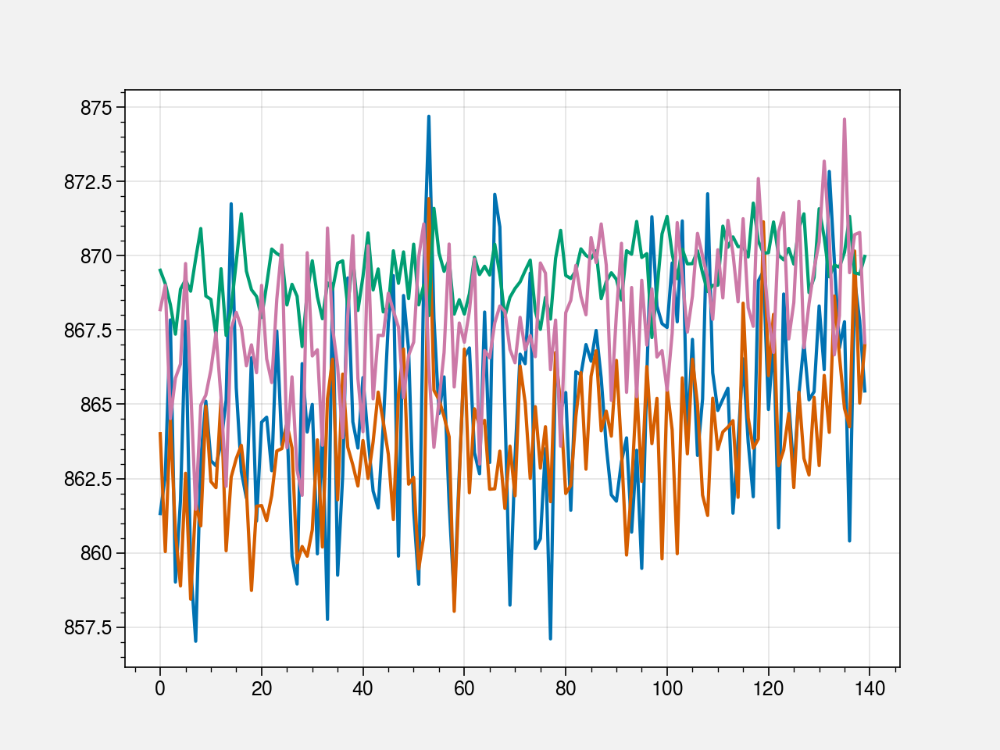

In [14]:
plt.plot(wp_meanseason_meanSP[:,0,50,60])
plt.plot(wp_meanseason_meanSP[:,1,50,60])
plt.plot(wp_meanseason_meanSP[:,2,50,60])
plt.plot(wp_meanseason_meanSP[:,3,50,60])

#### Eastern Alps mask

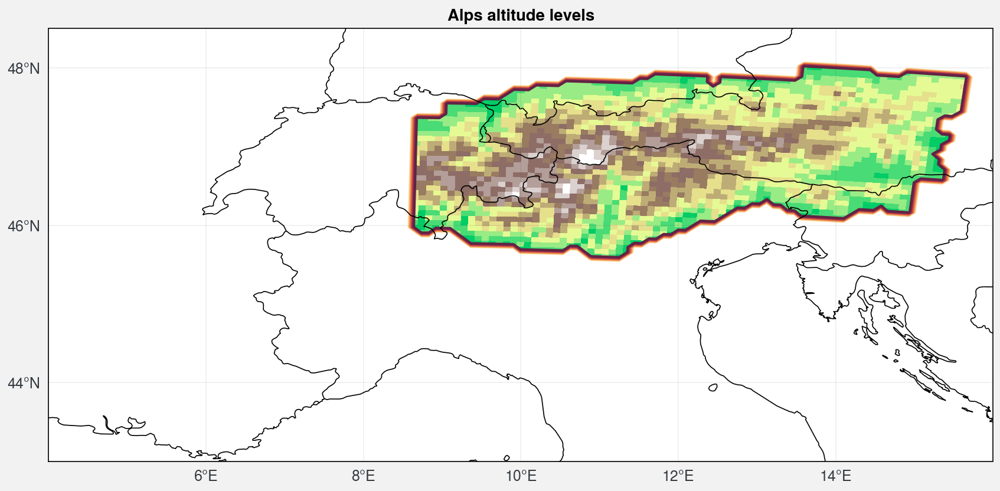

In [11]:
f, ax = pplt.subplots(proj='cyl', axwidth=8)

H_east_alps = np.ma.masked_array(H, mask=np.invert(east_alps))

ax.pcolormesh(lon, lat,H_east_alps,edgecolors='none',cmap=colors_land)
ax.contour(lon, lat,east_alps)
ax.format(**normal_format,suptitle='Alps altitude levels')


### Net Shortwave radiation trend

In [14]:
# SWD : Short Wave Down, SWU : Short Wave Up, NWS : Net Short Wave

wp_meanseason_meanSWD = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanSWD.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanSWU = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanSWU.npy')[:,:,jmin:jmax,imin:imax]

wp_meanseason_meanNSW = wp_meanseason_meanSWD - wp_meanseason_meanSWU

wp_meanseason_meanNSW_hist = wp_meanseason_meanNSW[:54,:,:,:]
wp_meanseason_meanNSW_fut = wp_meanseason_meanNSW[55:,:,:,:]

origin_NSW_hist=np.full(wp_meanseason_meanNSW_hist.shape[1:4],np.nan)
slope_NSW_hist=np.full(wp_meanseason_meanNSW_hist.shape[1:4],np.nan)
pvalue_NSW_hist=np.full(wp_meanseason_meanNSW_hist.shape[1:4],np.nan)

origin_NSW_fut=np.full(wp_meanseason_meanNSW_fut.shape[1:4],np.nan)
slope_NSW_fut=np.full(wp_meanseason_meanNSW_fut.shape[1:4],np.nan)
pvalue_NSW_fut=np.full(wp_meanseason_meanNSW_fut.shape[1:4],np.nan)

for i in range(wp_meanseason_meanNSW_fut.shape[3]):
    # print(str(lon)+'/'+str(les_season_maxT.shape[3]),end=' ')
    for j in range(wp_meanseason_meanNSW_fut.shape[2]):
        for season in range(4):
            linregress_NSW_hist = linregress(np.arange(wp_meanseason_meanNSW_hist.shape[0]), wp_meanseason_meanNSW_hist[:,season,j,i])
            origin_NSW_hist[season][j][i] = linregress_NSW_hist.intercept
            slope_NSW_hist[season][j][i] = linregress_NSW_hist.slope
            pvalue_NSW_hist[season][j][i] = linregress_NSW_hist.pvalue
            
            linregress_NSW_fut = linregress(np.arange(wp_meanseason_meanNSW_fut.shape[0]), wp_meanseason_meanNSW_fut[:,season,j,i])
            origin_NSW_fut[season][j][i] = linregress_NSW_fut.intercept
            slope_NSW_fut[season][j][i] = linregress_NSW_fut.slope
            pvalue_NSW_fut[season][j][i] = linregress_NSW_fut.pvalue

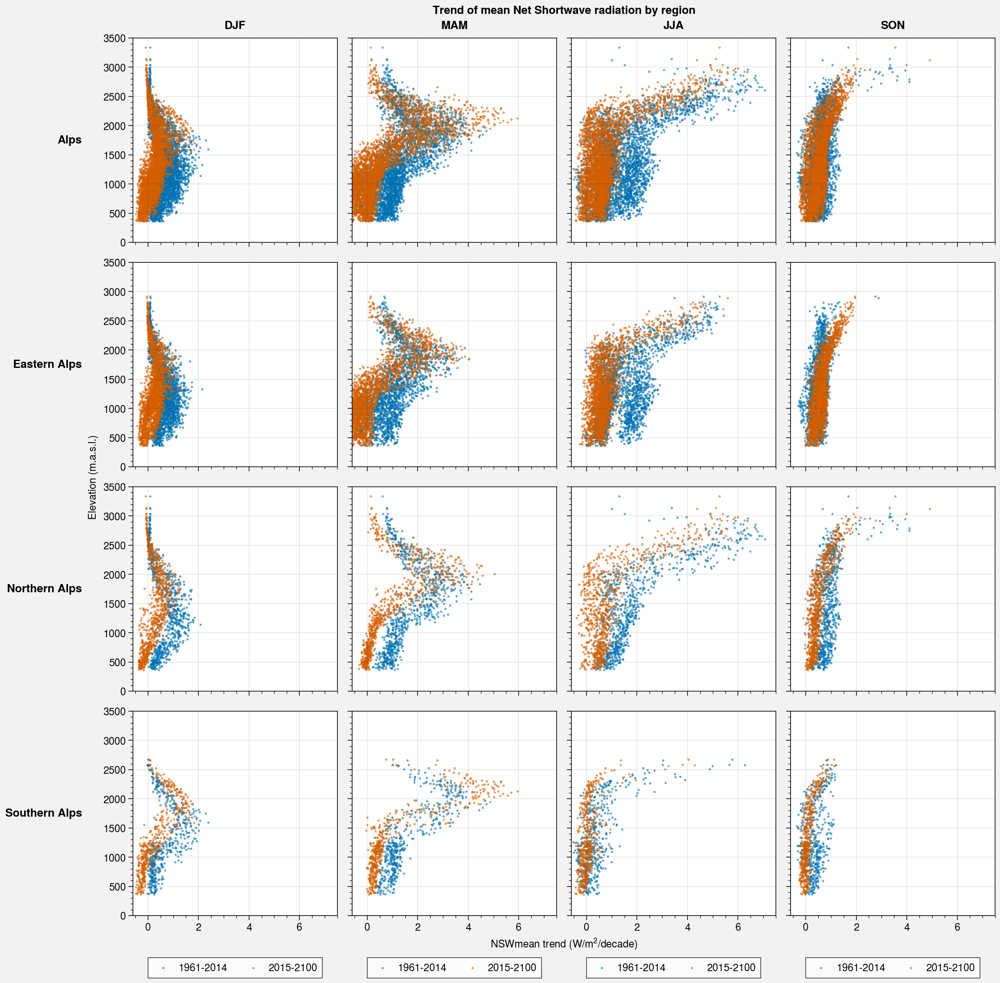

In [15]:
f, axs = pplt.subplots(ncols=4, nrows=4)
leg = ['1961-2014','2015-2100']

for i in range(4):
    slope_NSW_hist_alps = np.ma.masked_array(slope_NSW_hist[i], mask=np.invert(alps))
    slope_NSW_hist_east_alps = np.ma.masked_array(slope_NSW_hist[i], mask=np.invert(east_alps))
    slope_NSW_hist_north_alps = np.ma.masked_array(slope_NSW_hist[i], mask=np.invert(north_alps))
    slope_NSW_hist_south_alps = np.ma.masked_array(slope_NSW_hist[i], mask=np.invert(south_alps))
    slopes=[slope_NSW_hist_alps,slope_NSW_hist_east_alps,slope_NSW_hist_north_alps,slope_NSW_hist_south_alps]
    
    for j,slope in enumerate(slopes):
        ax = axs[i+4*j]
        blue_dot = ax.scatter(10*slope,ds.SH[jmin:jmax,imin:imax],s=2,alpha=0.5)
        
    
for i in range(4):
    slope_NSW_fut_alps = np.ma.masked_array(slope_NSW_fut[i], mask=np.invert(alps))
    slope_NSW_fut_east_alps = np.ma.masked_array(slope_NSW_fut[i], mask=np.invert(east_alps))
    slope_NSW_fut_north_alps = np.ma.masked_array(slope_NSW_fut[i], mask=np.invert(north_alps))
    slope_NSW_fut_south_alps = np.ma.masked_array(slope_NSW_fut[i], mask=np.invert(south_alps))
    slopes=[slope_NSW_fut_alps,slope_NSW_fut_east_alps,slope_NSW_fut_north_alps,slope_NSW_fut_south_alps]
    
    for j,slope in enumerate(slopes):
        ax = axs[i+4*j]
        orange_dot = ax.scatter(10*slope,ds.SH[jmin:jmax,imin:imax],s=2,alpha=0.5)
        ax.set_xlim((-0.6,7.5))
        ax.set_ylim((0.,3500))
        if(j==3):
            ax.legend([blue_dot,orange_dot],leg,loc='bottom')

axs.format(suptitle='Trend of mean Net Shortwave radiation by region',collabels=['DJF','MAM','JJA', 'SON'],
           rowlabels=['Alps','Eastern Alps','Northern Alps','Southern Alps'],xlabel='NSWmean trend (W/$m^2$/decade)',ylabel='Elevation (m.a.s.l.)')

### Specific Humidity

In [15]:
# QQz at 2m

wp_meanseason_meanQQz = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanQQz.npy')[:,:,jmin:jmax,imin:imax]

wp_meanseason_meanQQz_hist = wp_meanseason_meanQQz[:54,:,:,:]
wp_meanseason_meanQQz_fut = wp_meanseason_meanQQz[55:,:,:,:]

origin_QQz_hist=np.full(wp_meanseason_meanQQz_hist.shape[1:4],np.nan)
slope_QQz_hist=np.full(wp_meanseason_meanQQz_hist.shape[1:4],np.nan)
pvalue_QQz_hist=np.full(wp_meanseason_meanQQz_hist.shape[1:4],np.nan)

origin_QQz_fut=np.full(wp_meanseason_meanQQz_fut.shape[1:4],np.nan)
slope_QQz_fut=np.full(wp_meanseason_meanQQz_fut.shape[1:4],np.nan)
pvalue_QQz_fut=np.full(wp_meanseason_meanQQz_fut.shape[1:4],np.nan)

for i in range(wp_meanseason_meanQQz_fut.shape[3]):
    # print(str(lon)+'/'+str(les_season_maxT.shape[3]),end=' ')
    for j in range(wp_meanseason_meanQQz_fut.shape[2]):
        for season in range(4):
            linregress_QQz_hist = linregress(np.arange(wp_meanseason_meanQQz_hist.shape[0]), wp_meanseason_meanQQz_hist[:,season,j,i])
            origin_QQz_hist[season][j][i] = linregress_QQz_hist.intercept
            slope_QQz_hist[season][j][i] = linregress_QQz_hist.slope
            pvalue_QQz_hist[season][j][i] = linregress_QQz_hist.pvalue
            
            linregress_QQz_fut = linregress(np.arange(wp_meanseason_meanQQz_fut.shape[0]), wp_meanseason_meanQQz_fut[:,season,j,i])
            origin_QQz_fut[season][j][i] = linregress_QQz_fut.intercept
            slope_QQz_fut[season][j][i] = linregress_QQz_fut.slope
            pvalue_QQz_fut[season][j][i] = linregress_QQz_fut.pvalue

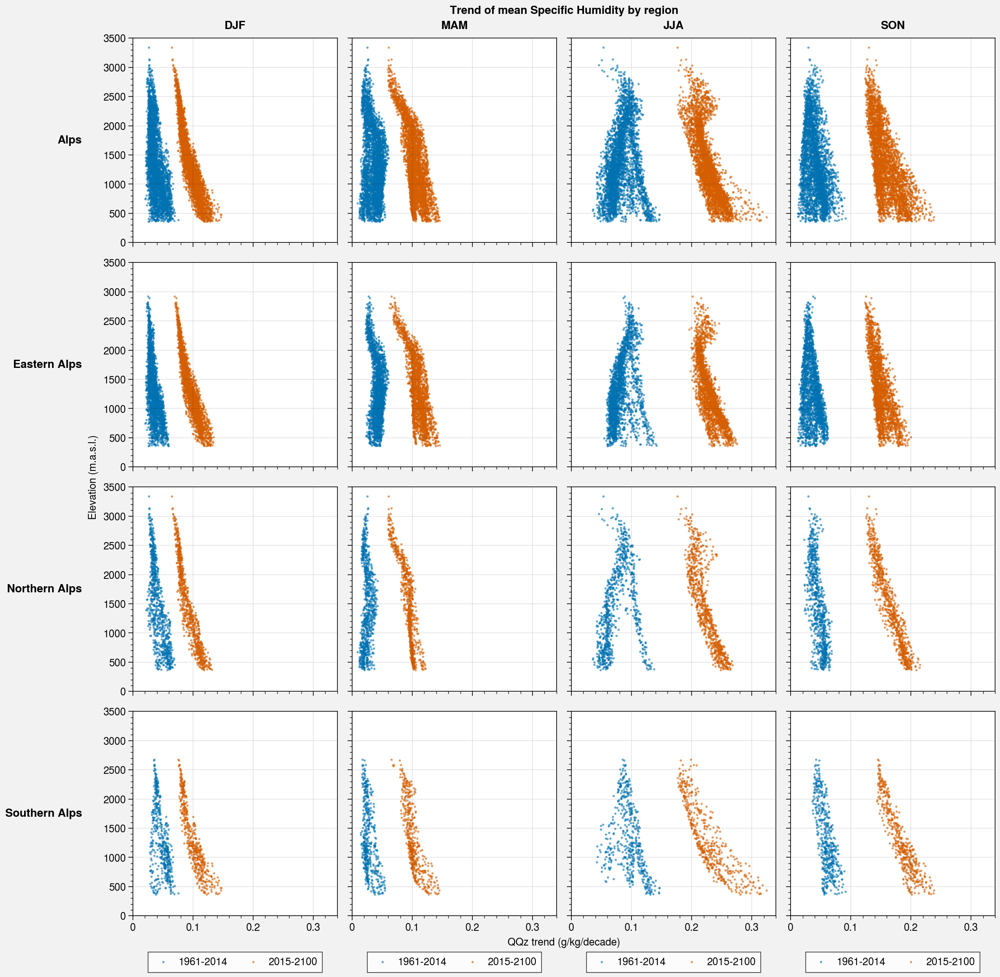

In [16]:
f, axs = pplt.subplots(ncols=4, nrows=4)
leg = ['1961-2014','2015-2100']

for i in range(4):
    slope_QQz_hist_alps = np.ma.masked_array(slope_QQz_hist[i], mask=np.invert(alps))
    slope_QQz_hist_east_alps = np.ma.masked_array(slope_QQz_hist[i], mask=np.invert(east_alps))
    slope_QQz_hist_north_alps = np.ma.masked_array(slope_QQz_hist[i], mask=np.invert(north_alps))
    slope_QQz_hist_south_alps = np.ma.masked_array(slope_QQz_hist[i], mask=np.invert(south_alps))
    slopes=[slope_QQz_hist_alps,slope_QQz_hist_east_alps,slope_QQz_hist_north_alps,slope_QQz_hist_south_alps]
    
    for j,slope in enumerate(slopes):
        ax = axs[i+4*j]
        blue_dot = ax.scatter(10*slope,ds.SH[jmin:jmax,imin:imax],s=2,alpha=0.5)
        
    
for i in range(4):
    slope_QQz_fut_alps = np.ma.masked_array(slope_QQz_fut[i], mask=np.invert(alps))
    slope_QQz_fut_east_alps = np.ma.masked_array(slope_QQz_fut[i], mask=np.invert(east_alps))
    slope_QQz_fut_north_alps = np.ma.masked_array(slope_QQz_fut[i], mask=np.invert(north_alps))
    slope_QQz_fut_south_alps = np.ma.masked_array(slope_QQz_fut[i], mask=np.invert(south_alps))
    slopes=[slope_QQz_fut_alps,slope_QQz_fut_east_alps,slope_QQz_fut_north_alps,slope_QQz_fut_south_alps]
    
    for j,slope in enumerate(slopes):
        ax = axs[i+4*j]
        orange_dot = ax.scatter(10*slope,ds.SH[jmin:jmax,imin:imax],s=2,alpha=0.5)
        ax.set_xlim((0.,0.34))
        ax.set_ylim((0.,3500))
        if(j==3):
            ax.legend([blue_dot,orange_dot],leg,loc='bottom')

axs.format(suptitle='Trend of mean Specific Humidity by region',collabels=['DJF','MAM','JJA', 'SON'],
           rowlabels=['Alps','Eastern Alps','Northern Alps','Southern Alps'],xlabel='QQz trend (g/kg/decade)',ylabel='Elevation (m.a.s.l.)')

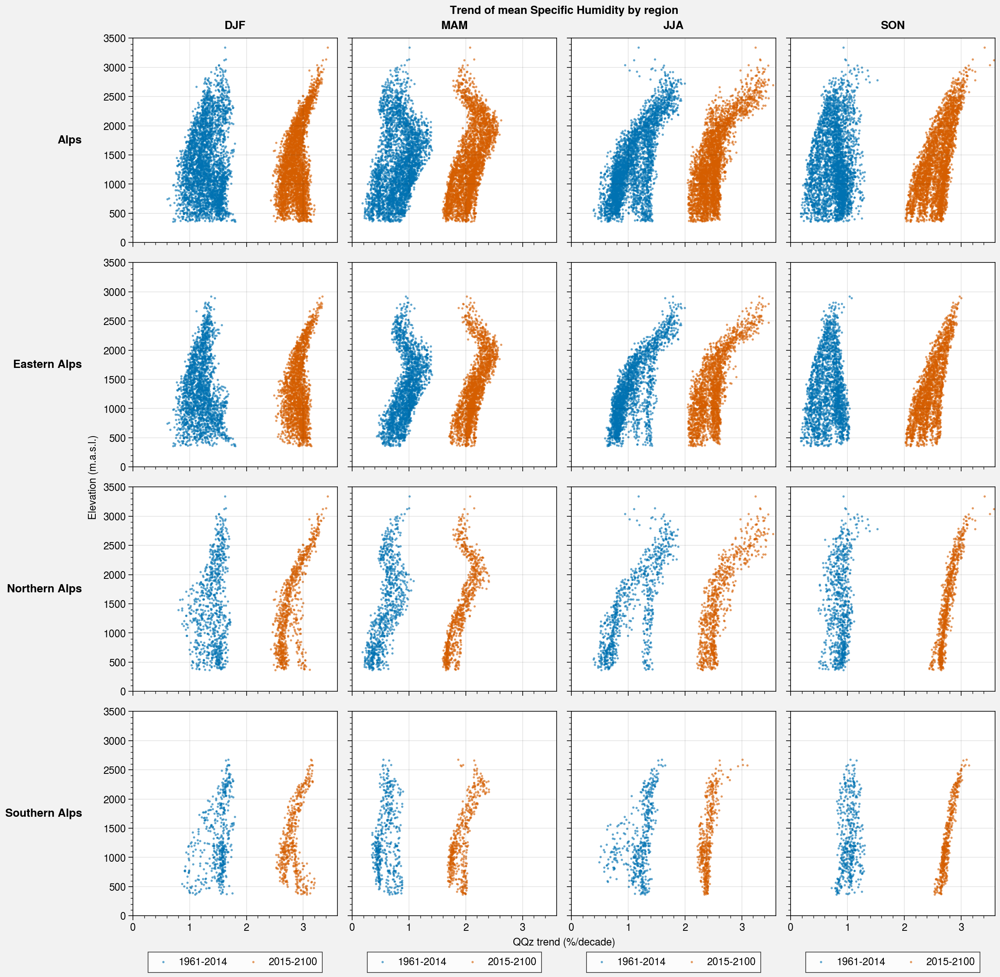

In [17]:
# same plot but normalized by mean of period

f, axs = pplt.subplots(ncols=4, nrows=4)
leg = ['1961-2014','2015-2100']

meanQQz_hist = wp_meanseason_meanQQz_hist.mean(axis=0)
meanQQz_fut = wp_meanseason_meanQQz_fut.mean(axis=0)

for i in range(4):
    slope_QQz_hist_alps = np.ma.masked_array(slope_QQz_hist[i]/meanQQz_hist[i], mask=np.invert(alps))
    slope_QQz_hist_east_alps = np.ma.masked_array(slope_QQz_hist[i]/meanQQz_hist[i], mask=np.invert(east_alps))
    slope_QQz_hist_north_alps = np.ma.masked_array(slope_QQz_hist[i]/meanQQz_hist[i], mask=np.invert(north_alps))
    slope_QQz_hist_south_alps = np.ma.masked_array(slope_QQz_hist[i]/meanQQz_hist[i], mask=np.invert(south_alps))
    slopes=[slope_QQz_hist_alps,slope_QQz_hist_east_alps,slope_QQz_hist_north_alps,slope_QQz_hist_south_alps]
    
    for j,slope in enumerate(slopes):
        ax = axs[i+4*j]
        blue_dot = ax.scatter(10*slope*100,ds.SH[jmin:jmax,imin:imax],s=2,alpha=0.5) # *100 to put in percent
        
    
for i in range(4):
    slope_QQz_fut_alps = np.ma.masked_array(slope_QQz_fut[i]/meanQQz_fut[i], mask=np.invert(alps))
    slope_QQz_fut_east_alps = np.ma.masked_array(slope_QQz_fut[i]/meanQQz_fut[i], mask=np.invert(east_alps))
    slope_QQz_fut_north_alps = np.ma.masked_array(slope_QQz_fut[i]/meanQQz_fut[i], mask=np.invert(north_alps))
    slope_QQz_fut_south_alps = np.ma.masked_array(slope_QQz_fut[i]/meanQQz_fut[i], mask=np.invert(south_alps))
    slopes=[slope_QQz_fut_alps,slope_QQz_fut_east_alps,slope_QQz_fut_north_alps,slope_QQz_fut_south_alps]
    
    for j,slope in enumerate(slopes):
        ax = axs[i+4*j]
        orange_dot = ax.scatter(10*slope*100,ds.SH[jmin:jmax,imin:imax],s=2,alpha=0.5) # *100 to put in percent
        ax.set_xlim((0.,3.6))
        ax.set_ylim((0.,3500))
        if(j==3):
            ax.legend([blue_dot,orange_dot],leg,loc='bottom')

axs.format(suptitle='Trend of mean Specific Humidity by region',collabels=['DJF','MAM','JJA', 'SON'],
           rowlabels=['Alps','Eastern Alps','Northern Alps','Southern Alps'],xlabel='QQz trend (%/decade)',ylabel='Elevation (m.a.s.l.)')

In [18]:
slope_QQz_hist.shape

(4, 91, 139)

### Warming maps

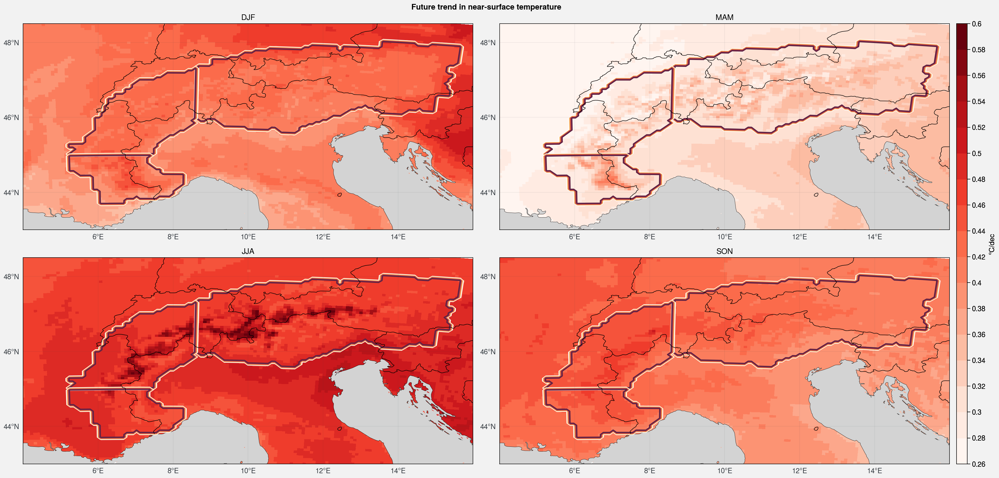

In [42]:
f, axs = pplt.subplots(proj='cyl', ncols=2, nrows=2, axwidth=8)

m=axs[0].pcolormesh(lon, lat, 10*slope_T_fut[0,:,:], levels=19,cmap='Reds',vmin=0.25,vmax=0.61)
f.colorbar(m,label= '°C/dec')
axs[0].contour(lon, lat,east_alps)
axs[0].contour(lon, lat,north_alps)
axs[0].contour(lon, lat,south_alps)
axs[0].format(**normal_format,title='DJF')
axs[0].format(ocean=True,oceancolor='lightgray',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])

m=axs[1].pcolormesh(lon, lat, 10*slope_T_fut[1,:,:], levels=19,cmap='Reds',vmin=0.25,vmax=0.61)
axs[1].contour(lon, lat,east_alps)
axs[1].contour(lon, lat,north_alps)
axs[1].contour(lon, lat,south_alps)
axs[1].format(**normal_format,title='MAM')
axs[1].format(ocean=True,oceancolor='lightgray',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])


m=axs[2].pcolormesh(lon, lat, 10*slope_T_fut[2,:,:], levels=19,cmap='Reds',vmin=0.25,vmax=0.61)
axs[2].contour(lon, lat,east_alps)
axs[2].contour(lon, lat,north_alps)
axs[2].contour(lon, lat,south_alps)
axs[2].format(**normal_format,title='JJA')
axs[2].format(ocean=True,oceancolor='lightgray',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])

m=axs[3].pcolormesh(lon, lat, 10*slope_T_fut[3,:,:], levels=19,cmap='Reds',vmin=0.25,vmax=0.61)
axs[3].contour(lon, lat,east_alps)
axs[3].contour(lon, lat,north_alps)
axs[3].contour(lon, lat,south_alps)
axs[3].format(**normal_format,title='SON')
axs[3].format(ocean=True,oceancolor='lightgray',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])

axs.format(suptitle='Future trend in near-surface temperature')

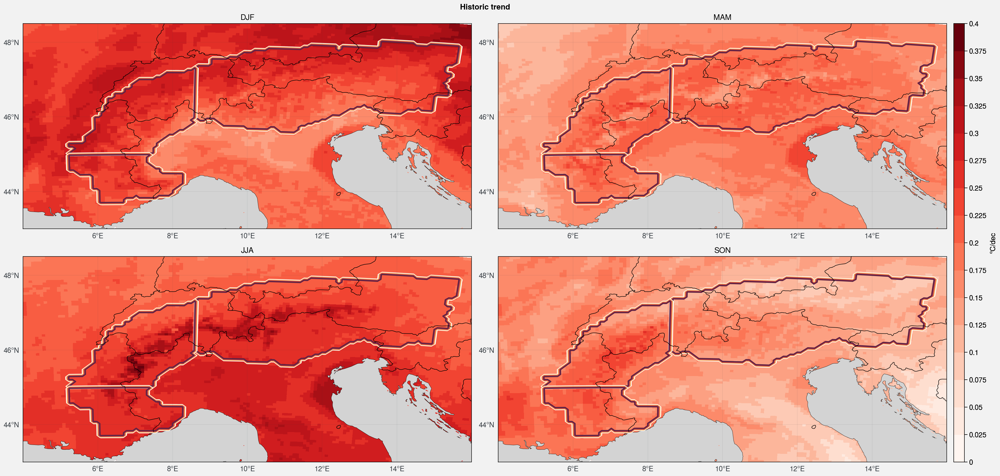

In [34]:
f, axs = pplt.subplots(proj='cyl', ncols=2, nrows=2, axwidth=8)

m=axs[0].pcolormesh(lon, lat, 10*slope_T_hist[0,:,:], levels=19,cmap='Reds',vmin=0.,vmax=0.4)
f.colorbar(m,label= '°C/dec')
axs[0].contour(lon, lat,east_alps)
axs[0].contour(lon, lat,north_alps)
axs[0].contour(lon, lat,south_alps)
axs[0].format(**normal_format,title='DJF')
axs[0].format(ocean=True,oceancolor='lightgray',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])

m=axs[1].pcolormesh(lon, lat, 10*slope_T_hist[1,:,:], levels=19,cmap='Reds',vmin=0.,vmax=0.4)
axs[1].contour(lon, lat,east_alps)
axs[1].contour(lon, lat,north_alps)
axs[1].contour(lon, lat,south_alps)
axs[1].format(**normal_format,title='MAM')
axs[1].format(ocean=True,oceancolor='lightgray',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])


m=axs[2].pcolormesh(lon, lat, 10*slope_T_hist[2,:,:], levels=19,cmap='Reds',vmin=0.,vmax=0.4)
axs[2].contour(lon, lat,east_alps)
axs[2].contour(lon, lat,north_alps)
axs[2].contour(lon, lat,south_alps)
axs[2].format(**normal_format,title='JJA')
axs[2].format(ocean=True,oceancolor='lightgray',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])

m=axs[3].pcolormesh(lon, lat, 10*slope_T_hist[3,:,:], levels=19,cmap='Reds',vmin=0.,vmax=0.4)
axs[3].contour(lon, lat,east_alps)
axs[3].contour(lon, lat,north_alps)
axs[3].contour(lon, lat,south_alps)
axs[3].format(**normal_format,title='SON')
axs[3].format(ocean=True,oceancolor='lightgray',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])

axs.format(suptitle='Historic trend')

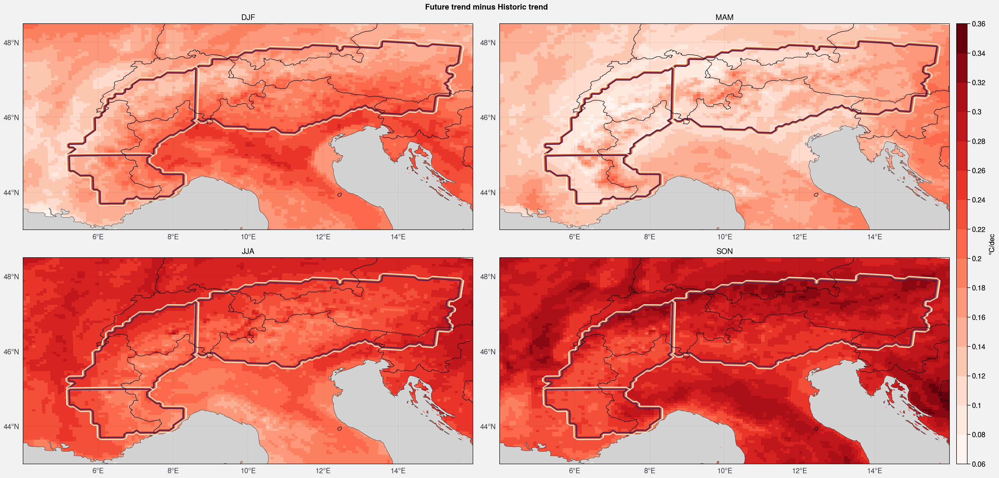

In [41]:
# fut - hist

f, axs = pplt.subplots(proj='cyl', ncols=2, nrows=2, axwidth=8)

m=axs[0].pcolormesh(lon, lat, 10*(slope_T_fut[0,:,:]-slope_T_hist[0,:,:]), levels=17,cmap='Reds',vmin=0.05,vmax=0.37)
f.colorbar(m,label= '°C/dec')
axs[0].contour(lon, lat,east_alps)
axs[0].contour(lon, lat,north_alps)
axs[0].contour(lon, lat,south_alps)
axs[0].format(**normal_format,title='DJF')
axs[0].format(ocean=True,oceancolor='lightgray',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])

m=axs[1].pcolormesh(lon, lat, 10*(slope_T_fut[1,:,:]-slope_T_hist[1,:,:]), levels=17,cmap='Reds',vmin=0.05,vmax=0.37)
axs[1].contour(lon, lat,east_alps)
axs[1].contour(lon, lat,north_alps)
axs[1].contour(lon, lat,south_alps)
axs[1].format(**normal_format,title='MAM')
axs[1].format(ocean=True,oceancolor='lightgray',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])


m=axs[2].pcolormesh(lon, lat, 10*(slope_T_fut[2,:,:]-slope_T_hist[2,:,:]), levels=17,cmap='Reds',vmin=0.05,vmax=0.37)
axs[2].contour(lon, lat,east_alps)
axs[2].contour(lon, lat,north_alps)
axs[2].contour(lon, lat,south_alps)
axs[2].format(**normal_format,title='JJA')
axs[2].format(ocean=True,oceancolor='lightgray',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])

m=axs[3].pcolormesh(lon, lat, 10*(slope_T_fut[3,:,:]-slope_T_hist[3,:,:]), levels=17,cmap='Reds',vmin=0.05,vmax=0.37)
axs[3].contour(lon, lat,east_alps)
axs[3].contour(lon, lat,north_alps)
axs[3].contour(lon, lat,south_alps)
axs[3].format(**normal_format,title='SON')
axs[3].format(ocean=True,oceancolor='lightgray',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])

axs.format(suptitle='Future trend minus Historic trend')

In [37]:
10*(slope_T_fut-slope_T_hist).max()

0.35937828452220155

### Trend in Specific humidity maps

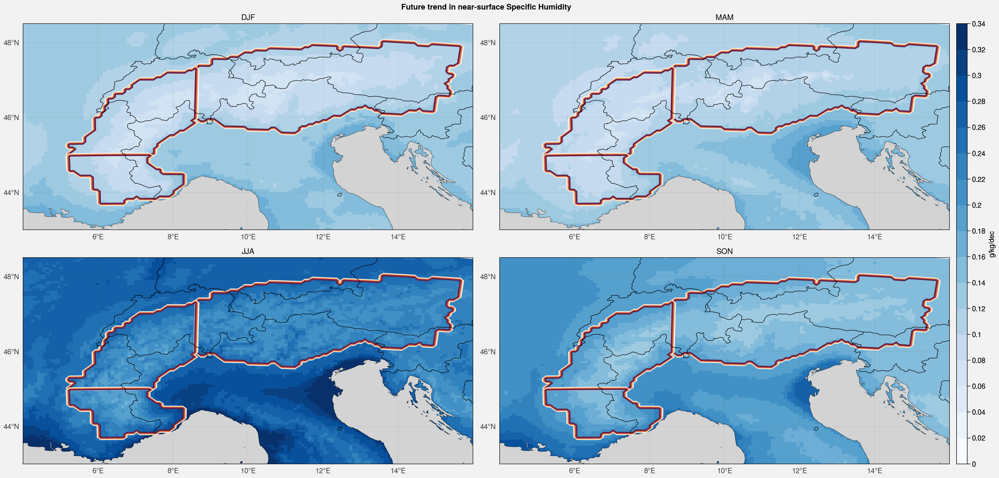

In [28]:
f, axs = pplt.subplots(proj='cyl', ncols=2, nrows=2, axwidth=8)

for i in range(4):
    m=axs[i].pcolormesh(lon, lat, 10*slope_QQz_fut[i], levels=19,cmap='Blues',vmin=0.,vmax=0.35)
    
    axs[i].contour(lon, lat,east_alps)
    axs[i].contour(lon, lat,north_alps)
    axs[i].contour(lon, lat,south_alps)
    axs[i].format(**normal_format,title=seasons[i])
    axs[i].format(ocean=True,oceancolor='lightgray',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])

f.colorbar(m,label= 'g/kg/dec')
axs.format(suptitle='Future trend in near-surface Specific Humidity')

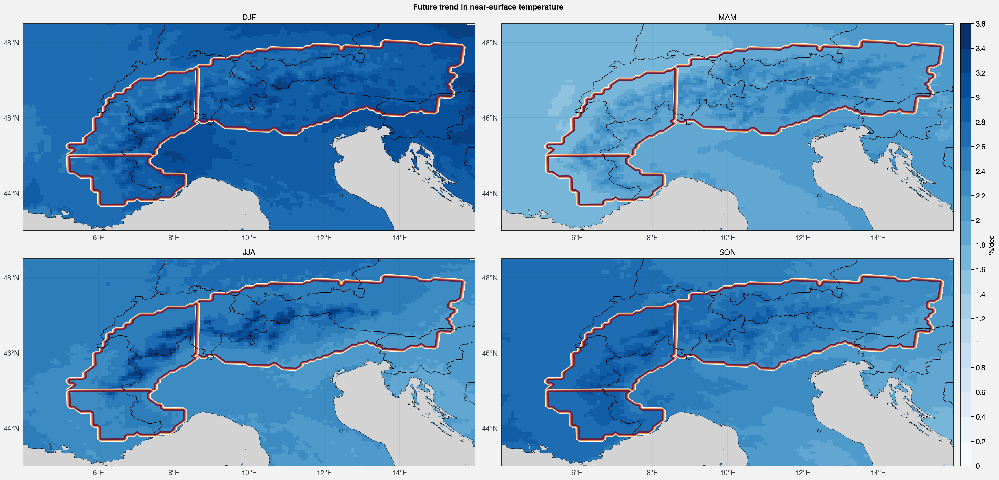

In [29]:

f, axs = pplt.subplots(proj='cyl', ncols=2, nrows=2, axwidth=8)

for i in range(4):
    m=axs[i].pcolormesh(lon, lat, 10*slope_QQz_fut[i]/meanQQz_fut[i]*100, levels=19,cmap='Blues',vmin=0.,vmax=3.6) # *100 to convert in percent
    
    axs[i].contour(lon, lat,east_alps)
    axs[i].contour(lon, lat,north_alps)
    axs[i].contour(lon, lat,south_alps)
    axs[i].format(**normal_format,title=seasons[i])
    axs[i].format(ocean=True,oceancolor='lightgray',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])

f.colorbar(m,label= '%/dec')
axs.format(suptitle='Future trend in near-surface temperature')